# SPIDER SVIs (stereo-seq mouse brain dataset)
This notebook showcases SPIDER SVIs using the stereo-seq mouse brain dataset

The utils.py file can be downloaded from https://github.com/deepomicslab/SPIDER-paper/blob/main/notebooks/utils.py

In [2]:
import sys
import os
import numpy as np
import pandas as pd
import anndata
import scanpy as sc
import matplotlib.pyplot as plt
import time
R_path = 'source /etc/profile;module load GCC/11.2.0 OpenMPI/4.1.1 R/4.2.0 Anaconda3/2022.05 R-bundle-Bioconductor/3.15-R-4.2.0;R'
from spider import SPIDER
op=SPIDER()

ds = 'saw'
sample_name = 'mouse'
adata = anndata.read_h5ad(f'../example_datasets/{ds}/{sample_name}/adata.h5ad')

if not os.path.exists(f'../results/{ds}'):
    os.makedirs(f'../results/{ds}/')
out_f = f'../results/{ds}/{sample_name}/'
if not os.path.exists(out_f):
    os.makedirs(out_f)
if len(adata.obs_names) > 200:
    sc.pp.filter_genes(adata, min_cells=20)
    
start = time.time()
idata = op.prep(adata, cluster_key=adata.uns['cluster_key'], is_human=adata.uns['is_human'], is_sc=adata.uns['is_sc'], itermax=1000, imputation=True, normalize_total=True)
idata.write(f'{out_f}idata.h5ad')
runtime = time.time()-start
with open(f'{out_f}ot_runtime.txt', 'w') as f:
    f.write(str(runtime))
    
start = time.time()
op.svi.tf_corr(idata, adata, adata.uns['is_human'], out_f, threshold=0.3, n_jobs=30, overwrite=False, step=None, keep_top_score=5)
runtime = time.time()-start
with open(f'{out_f}tf_runtime.txt', 'w') as f:
    f.write(str(runtime))
    
start = time.time()
idata, meta_idata = op.find_svi(idata, out_f, R_path, alpha=0.3, overwrite=False, n_jobs=1, svi_number=0)
runtime = time.time()-start
with open(f'{out_f}svi_runtime.txt', 'w') as f:
    f.write(str(runtime))


Using mouse LR pair dataset.
Using mouse pathway dataset.
Running imputation with MAGIC
Calculating MAGIC...
  Running MAGIC on 2343 cells and 17400 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...
    Calculated PCA in 3.90 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.37 seconds.
    Calculating affinities...
    Calculated affinities in 0.42 seconds.
  Calculated graph and diffusion operator in 4.79 seconds.
  Running MAGIC with `solver='exact'` on 17400-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 0.96 seconds.
Calculated MAGIC in 5.93 seconds.
Normalizing total counts per cell to the median of total counts for cells before normalization
using 0.75
Located 6851 interfaces on 7004 power cell boundaries with distance cutoff 282.842712474619.
Dropped 1800 out of 6851 interfaces for low capacity c

Models:   0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/1295 [00:00<?, ?it/s]

  0%|          | 0/1295 [00:00<?, ?it/s]

  0%|          | 0/1295 [00:00<?, ?it/s]

  0%|          | 0/1295 [00:00<?, ?it/s]

  0%|          | 0/1295 [00:00<?, ?it/s]

  0%|          | 0/1295 [00:00<?, ?it/s]

  0%|          | 0/1295 [00:00<?, ?it/s]

  0%|          | 0/1295 [00:00<?, ?it/s]

  0%|          | 0/1295 [00:00<?, ?it/s]

  0%|          | 0/1295 [00:00<?, ?it/s]

Added key SpatialDE in idata.uns
Added key SPARKX in idata.uns
Added key scGCO in idata.uns


  0%|          | 0/1000 [00:00<?, ?/s]

Added key moranI in idata.uns


  0%|          | 0/1000 [00:00<?, ?/s]

Added key gearyC in idata.uns
finished running all SVI tests
Using the results from SVI identification methods: ['SOMDE' 'SpatialDE' 'SpatialDE2' 'SPARKX' 'nnSVG' 'scGCO' 'gearyC'
 'moranI']
84/1295 SVIs identified (threshold=0.01).
Excluding 6 genes without TF support
78/1295 tf-supported SVIs identified.
normalizing
normalizing
normalizing
{0: 0, 1: 1, 2: 2, 3: 3}
[3 0 0 3 3 0 0 0 0 0 0 0 0 0 0 0 0 0 0 3 0 3 3 0 1 3 0 0 3 3 0 0 3 3 3 0 3
 0 0 0 2 0 3 0 1 0 3 3 0 3 0 0 3 3 3 3 1 0 3 3 0 0 0 3 1 0 0 3 3 3 0 3 0 3
 1 3 2 0]
[41  5  2 30]
eventually found 4 patterns
[3 0 0 3 3 0 0 0 0 0 0 0 0 0 0 0 0 0 0 3 0 3 3 0 1 3 0 0 3 3 0 0 3 3 3 0 3
 0 0 0 2 0 3 0 1 0 3 3 0 3 0 0 3 3 3 3 1 0 3 3 0 0 0 3 1 0 0 3 3 3 0 3 0 3
 1 3 2 0]
Added key pattern_score in idata.obsm and method results and running time in uns


The running time of the above block is about 1 hour

Using the results from SVI identification methods: ['SOMDE' 'SpatialDE' 'SpatialDE2' 'SPARKX' 'nnSVG' 'scGCO' 'gearyC'
 'moranI']
84/1295 SVIs identified (threshold=0.01).
Excluding 6 genes without TF support
78/1295 tf-supported SVIs identified.
evaluating with ['moranI' 'gearyC' 'SOMDE' 'nnSVG']
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Geary
C (rev.)_SVI vs. Geary
C (rev.)_Excluded: Mann-Whitney-Wilcoxon test greater with Benjamini-Hochberg correction, P_val:1.730e-29 U_stat=8.337e+04
Moran
I_SVI vs. Moran
I_Excluded: Mann-Whitney-Wilcoxon test greater with Benjamini-Hochberg correction, P_val:1.120e-29 U_stat=8.349e+04
FSV
(SOMDE)_SVI vs. FSV
(SOMDE)_Excluded: Mann-Whitney-Wilcoxon test greater with Benjamini-Hochberg correction, P_val:5.168e-27 U_stat=8.172e+04
LR
(SOMDE)_SVI vs. LR
(SOMDE)_Excluded: Mann-Whitney-Wilcoxon test greater with Benj

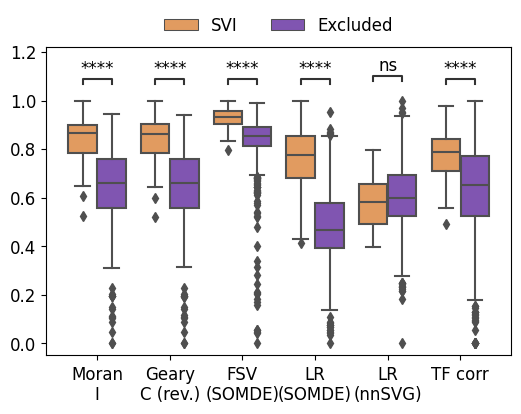

In [3]:
import matplotlib.pyplot as plt
svi_df, svi_df_strict = op.svi.combine_SVI(idata,threshold=0.01)
df = op.svi.eva_SVI(idata, svi_df_strict)

In [14]:
%reload_ext autoreload
%autoreload 2
from utils import *

Added key cell_pattern in idata.uns
Added key cell_score in idata.uns
Added key interaction_pattern, interaction_score in adata.obsm
Added key rank_interaction_score_groups, rank_interaction_pattern_groups in adata.uns


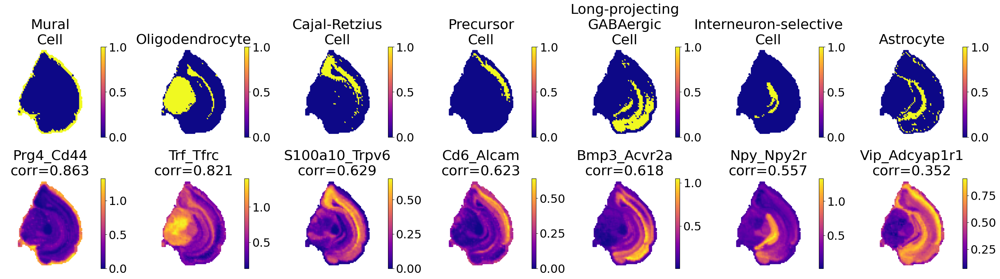

In [21]:
saw_celltype_corr(idata, adata)

In [22]:
labels = idata.obs['label'].unique()[idata.obs['label'].value_counts()>1]
intras = [x for x in labels if len(np.unique(x.split('_'))) > 1]
idata_subset = idata[idata.obs['label'].isin(intras), idata.var.query('is_svi==1').index]
sc.tl.rank_genes_groups(idata_subset, groupby='label')
sc.set_figure_params(dpi=300, fontsize=20, figsize=(6, 6))
sc.pl.rank_genes_groups_dotplot(idata_subset, standard_scale='var', n_genes=1, show=False, dendrogram=True, color_map='plasma')


         Falling back to preprocessing with `sc.pp.pca` and default params.


{'mainplot_ax': <Axes: >,
 'group_extra_ax': <Axes: >,
 'gene_group_ax': <Axes: >,
 'size_legend_ax': <Axes: title={'center': 'Fraction of cells\nin group (%)'}>,
 'color_legend_ax': <Axes: title={'center': 'Mean expression\nin group'}>}

{'mainplot_ax': <Axes: >,
 'group_extra_ax': <Axes: >,
 'gene_group_ax': <Axes: >,
 'size_legend_ax': <Axes: title={'center': 'Fraction of cells\nin group (%)'}>,
 'color_legend_ax': <Axes: title={'center': 'Mean expression\nin group'}>}

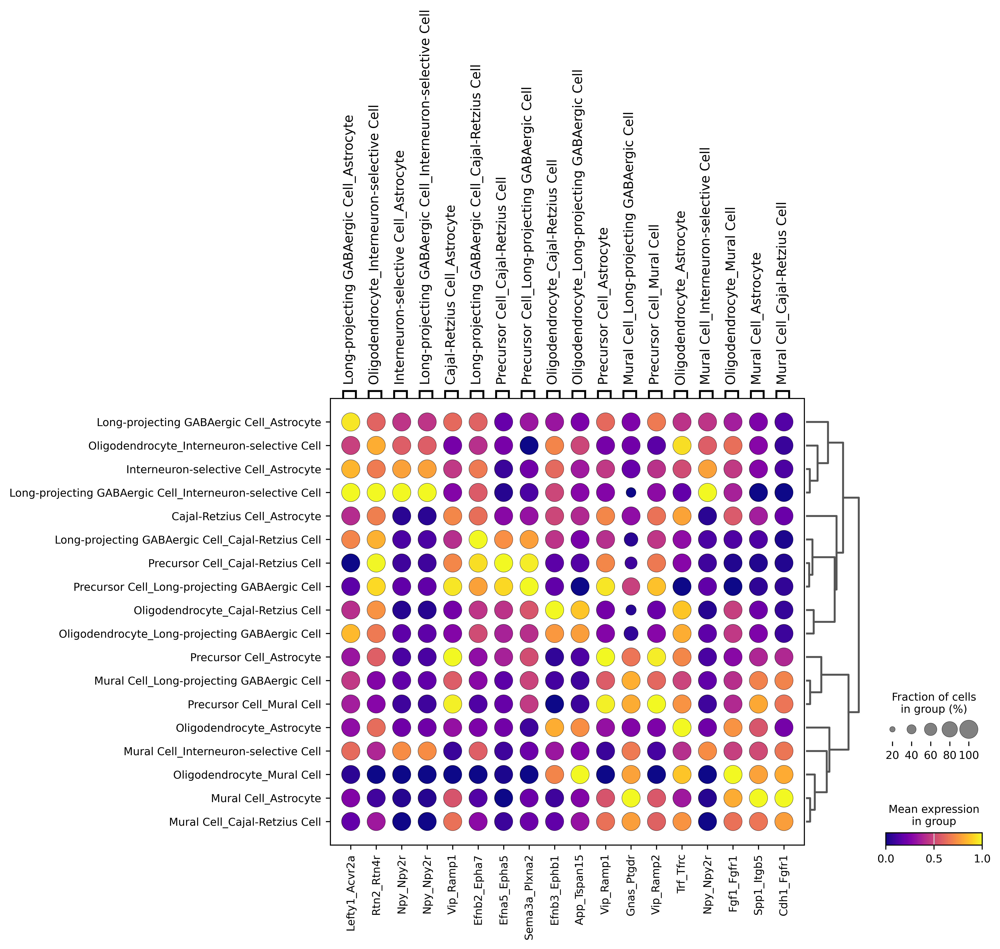

In [23]:
sc.set_figure_params(dpi=300, fontsize=10)
sc.pl.rank_genes_groups_dotplot(idata_subset, standard_scale='var', n_genes=1, show=False, dendrogram=True, color_map='plasma')

(2690.0, 13910.0, 5530.0, 20270.0)

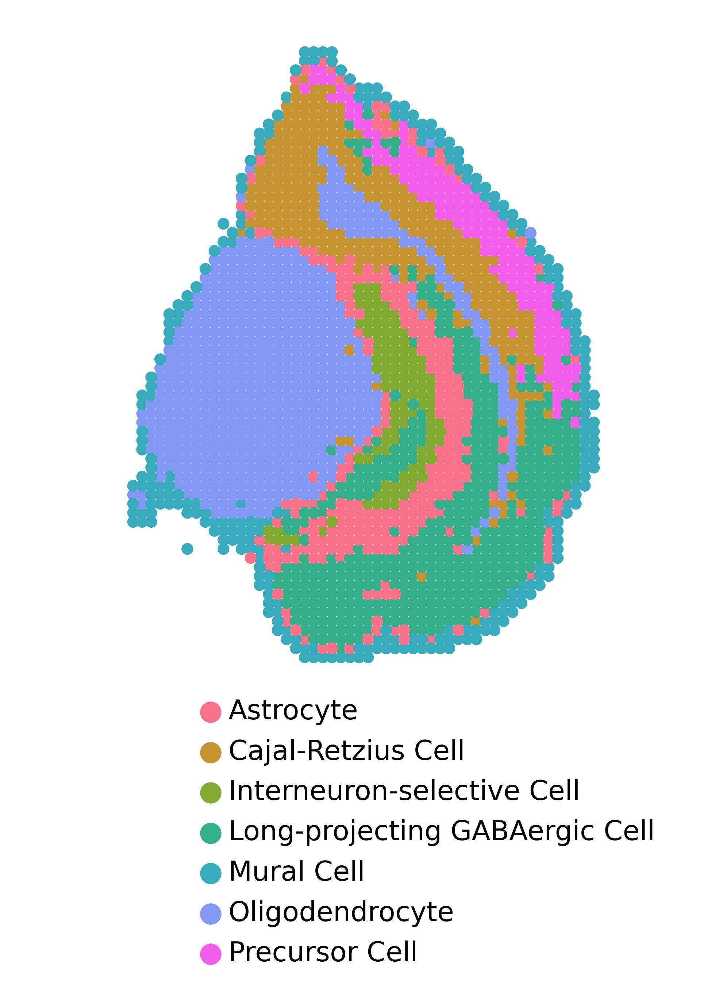

In [24]:
import matplotlib.pyplot as plt
to_plot = pd.DataFrame(adata.obs['cell_type'])
to_plot[['x','y']] = adata.obsm['spatial']
import seaborn as sns
custom_palette = sns.color_palette("husl",to_plot.cell_type.nunique())
sns.scatterplot(data=to_plot, x='x', y='y', hue='cell_type', palette=custom_palette, s=15, linewidth=0, legend=True)
# move legend to right
plt.legend(bbox_to_anchor=(0.25, 0), loc=2, borderaxespad=0., ncols=1, frameon=False, fontsize=9)
plt.axis('equal')
plt.axis('off')

In [28]:
adata, adata_lri, adata_pattern = op.cell_transform(idata[:, idata.var.query('is_svi==1').index], adata, label=adata.uns['cluster_key'])

sc.pp.neighbors(adata_lri, n_neighbors=20, use_rep='X')
sc.tl.umap(adata_lri)
sc.tl.leiden(adata_lri,resolution=1, seed=0, key_added='leiden_res1')
sc.tl.leiden(adata_lri,resolution=0.5, seed=0, key_added='leiden_res0.5')
sc.tl.leiden(adata_lri,resolution=0.1, seed=0, key_added='leiden_res0.1')



Added key cell_pattern in idata.uns
Added key cell_score in idata.uns
Added key interaction_pattern, interaction_score in adata.obsm
Added key rank_interaction_score_groups, rank_interaction_pattern_groups in adata.uns


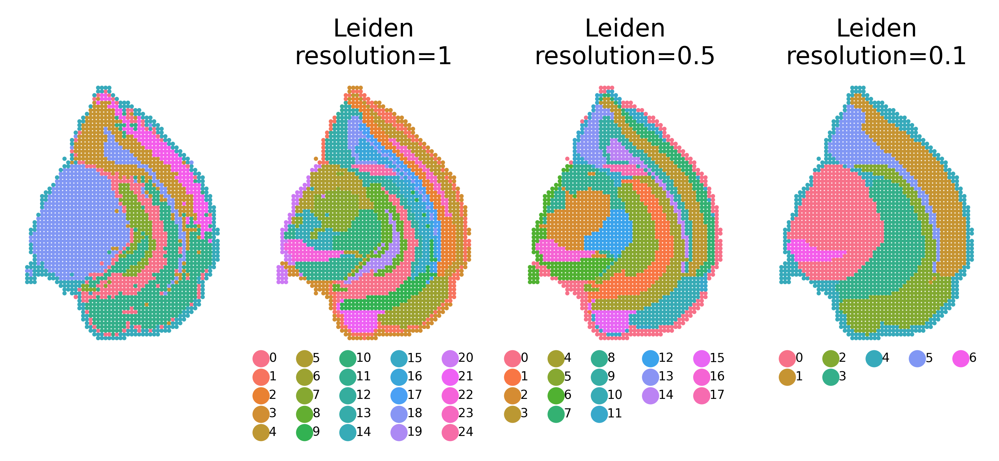

In [31]:
multiple_leiden(adata_lri, adata)

         Falling back to preprocessing with `sc.pp.pca` and default params.


{'mainplot_ax': <Axes: >,
 'group_extra_ax': <Axes: >,
 'gene_group_ax': <Axes: >,
 'size_legend_ax': <Axes: title={'center': 'Fraction of cells\nin group (%)'}>,
 'color_legend_ax': <Axes: title={'center': 'Mean expression\nin group'}>}

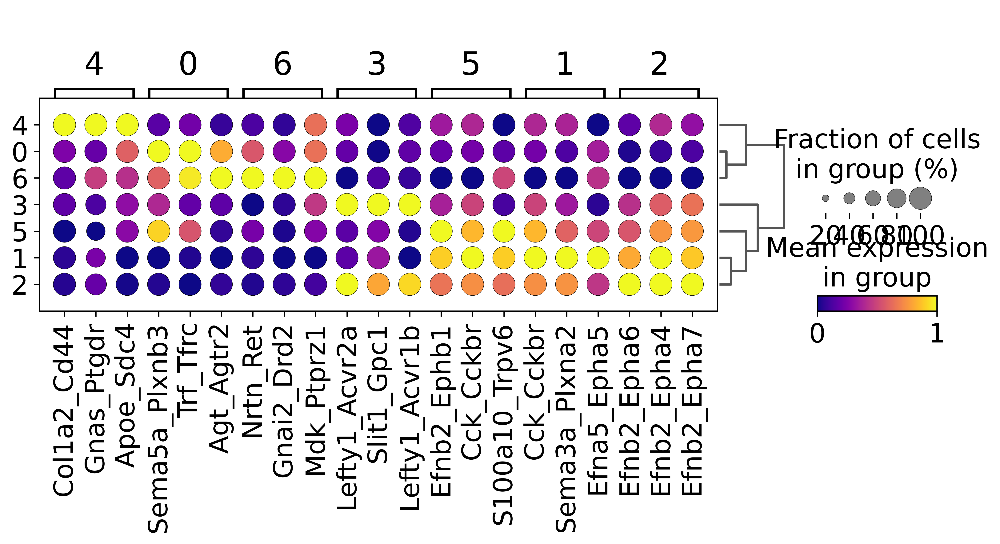

In [32]:
sc.tl.rank_genes_groups(adata_lri, groupby='leiden_res0.1')
sc.set_figure_params(dpi=300, fontsize=20, figsize=(6, 6))
sc.pl.rank_genes_groups_dotplot(adata_lri, standard_scale='var', n_genes=3, show=False, dendrogram=True, color_map='plasma')

(2690.0, 13910.0, 5530.0, 20270.0)

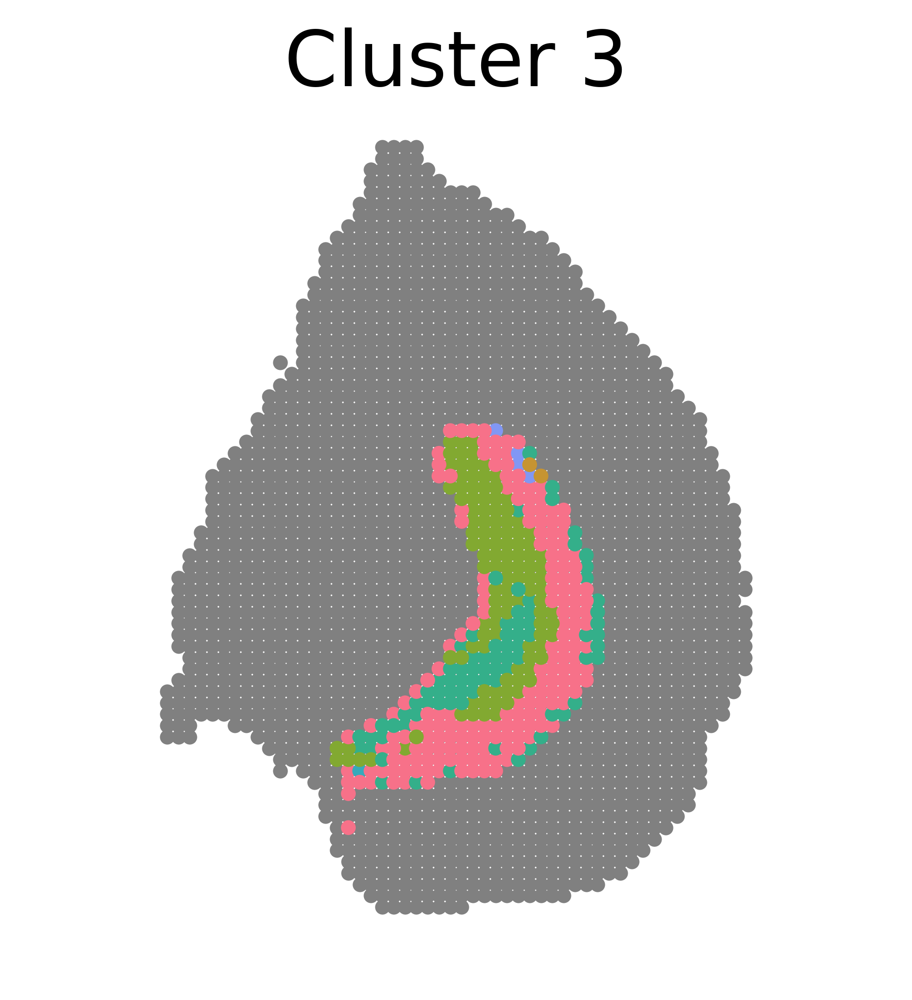

In [33]:
import matplotlib.pyplot as plt
to_plot = pd.DataFrame(adata.obs['cell_type'])
to_plot['leiden_res0.1'] = adata_lri.obs.loc[to_plot.index,'leiden_res0.1']
to_plot['leiden_res0.1_celltype'] = to_plot['cell_type']
to_plot[['x','y']] = adata.obsm['spatial']
import seaborn as sns
plt.figure(figsize=(4, 4))
to_plot.loc[to_plot[to_plot['leiden_res0.1'] != '3'].index, 'leiden_res0.1_celltype'] = np.nan
custom_palette = sns.color_palette("husl",to_plot['cell_type'].nunique())
sns.scatterplot(data=to_plot, x='x', y='y', s=15, linewidth=0, legend=False, color='grey')
sns.scatterplot(data=to_plot, x='x', y='y', hue='leiden_res0.1_celltype', palette=custom_palette, s=15, linewidth=0, legend=False)
# move legend to right
plt.legend(bbox_to_anchor=(0.25, 0), loc=2, borderaxespad=0., ncols=1, frameon=False, fontsize=9)
plt.title('Cluster 3', fontsize=20)
plt.axis('equal')
plt.axis('off')

(2690.0, 13910.0, 5530.0, 20270.0)

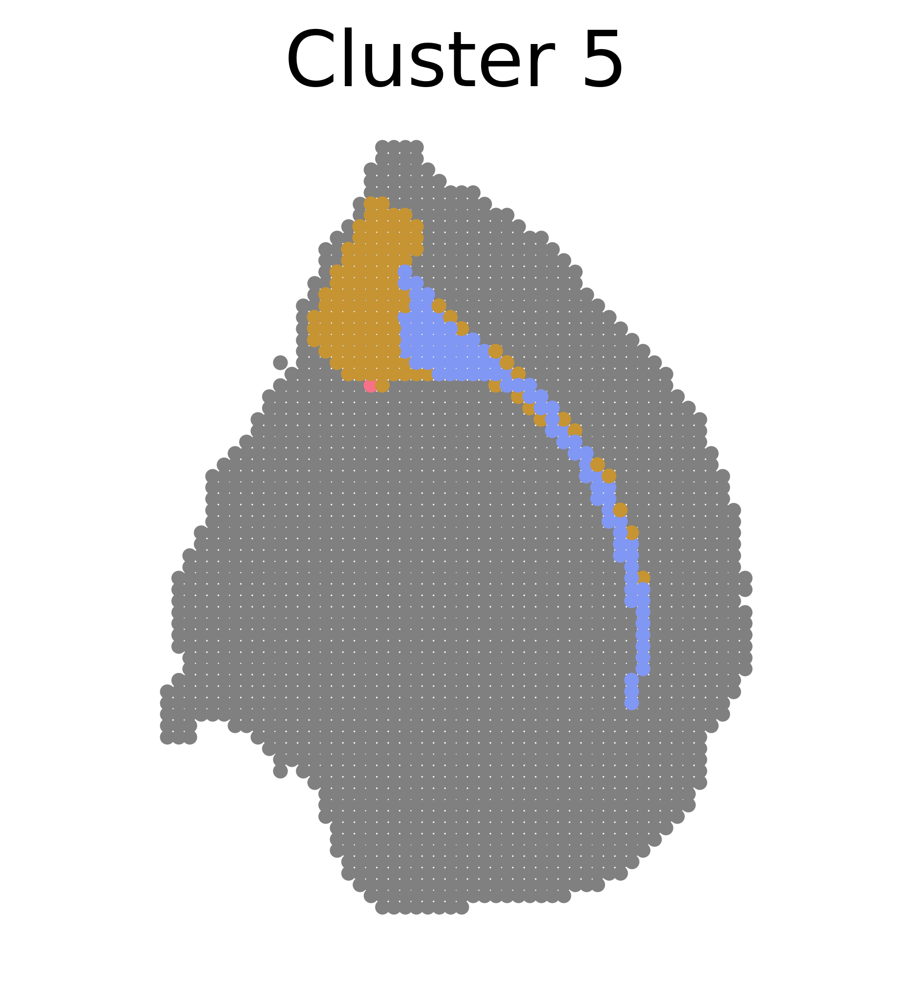

In [34]:
import matplotlib.pyplot as plt
to_plot = pd.DataFrame(adata.obs['cell_type'])
to_plot['leiden_res0.1'] = adata_lri.obs.loc[to_plot.index,'leiden_res0.1']
to_plot['leiden_res0.1_celltype'] = to_plot['cell_type']
to_plot[['x','y']] = adata.obsm['spatial']
import seaborn as sns
plt.figure(figsize=(4, 4))
to_plot.loc[to_plot[to_plot['leiden_res0.1'] != '5'].index, 'leiden_res0.1_celltype'] = np.nan
custom_palette = sns.color_palette("husl",to_plot['cell_type'].nunique())
sns.scatterplot(data=to_plot, x='x', y='y', s=15, linewidth=0, legend=False, color='grey')
sns.scatterplot(data=to_plot, x='x', y='y', hue='leiden_res0.1_celltype', palette=custom_palette, s=15, linewidth=0, legend=False)
# move legend to right
plt.legend(bbox_to_anchor=(0.25, 0), loc=2, borderaxespad=0., ncols=1, frameon=False, fontsize=9)
plt.title('Cluster 5', fontsize=20)
plt.axis('equal')
plt.axis('off')

In [40]:
%reload_ext autoreload
%autoreload 2
from utils import *

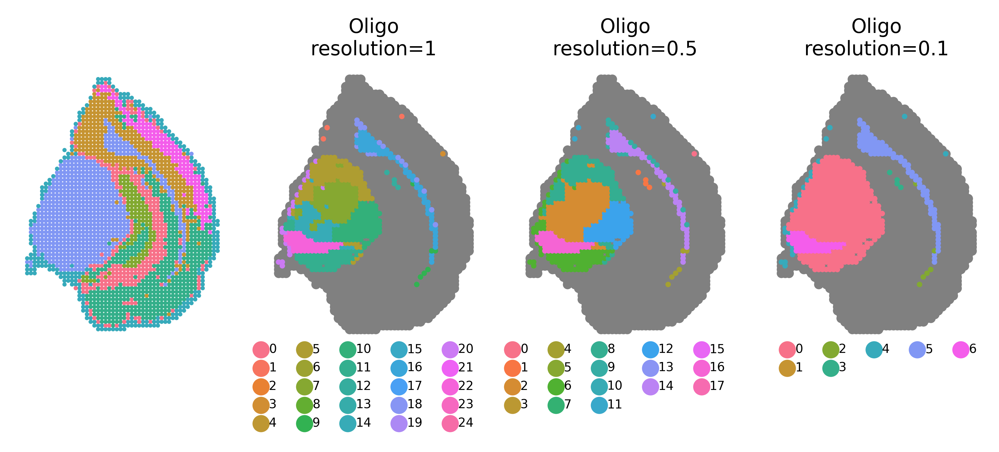

In [39]:
multiple_leiden_oligo(adata_lri, adata)

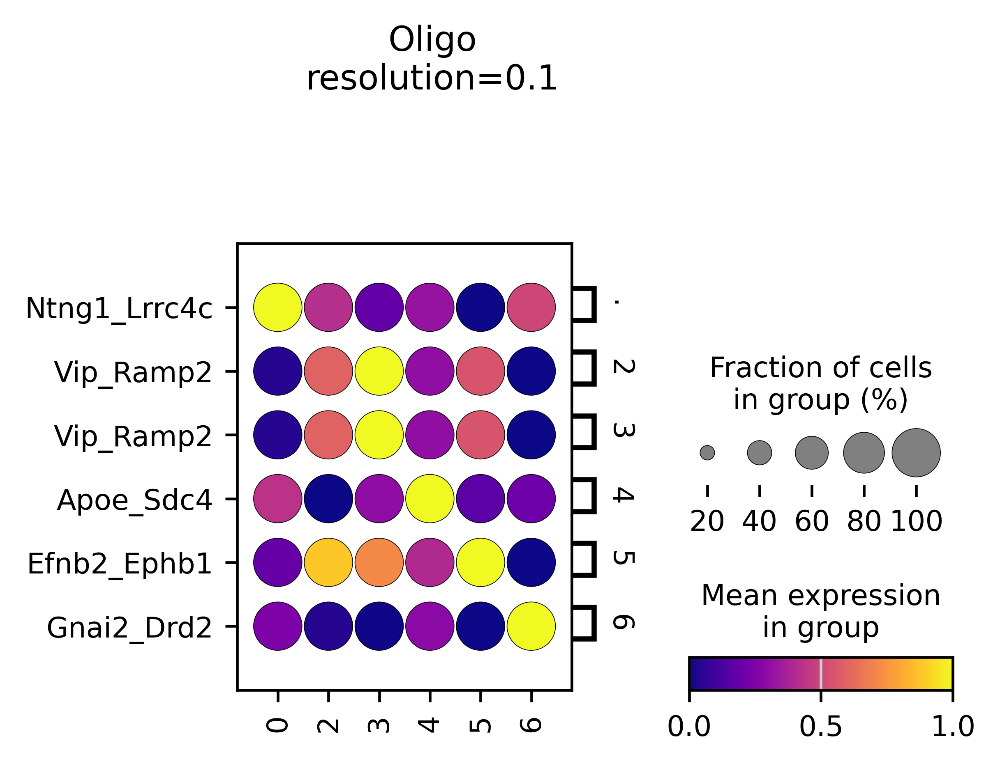

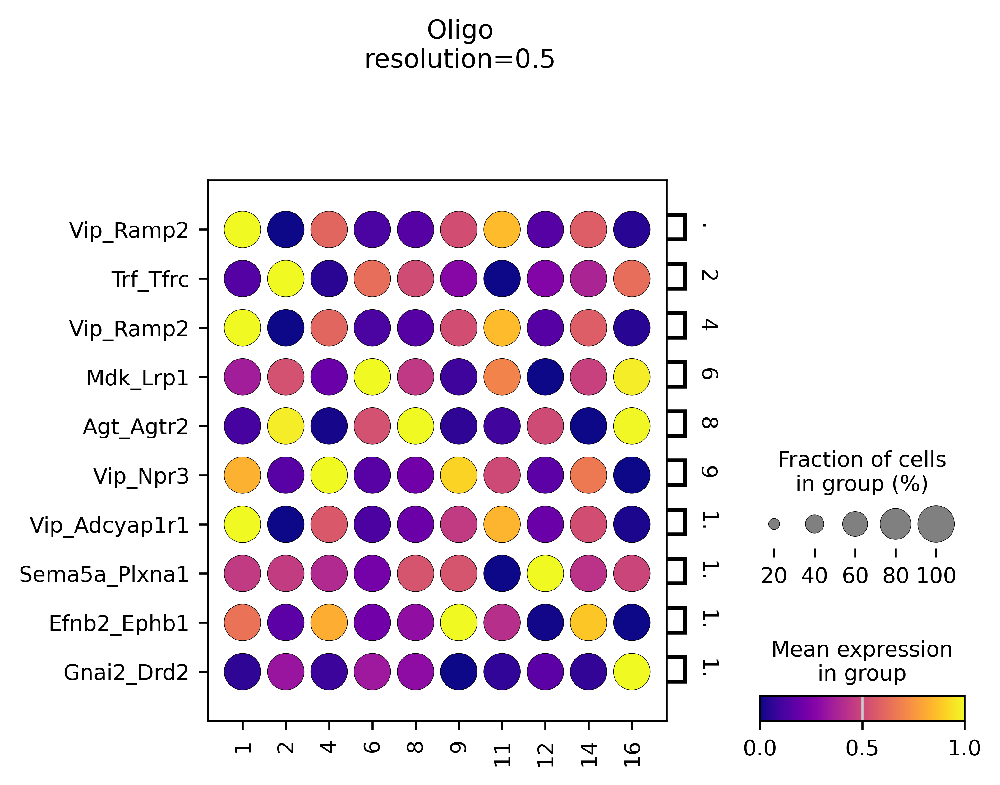

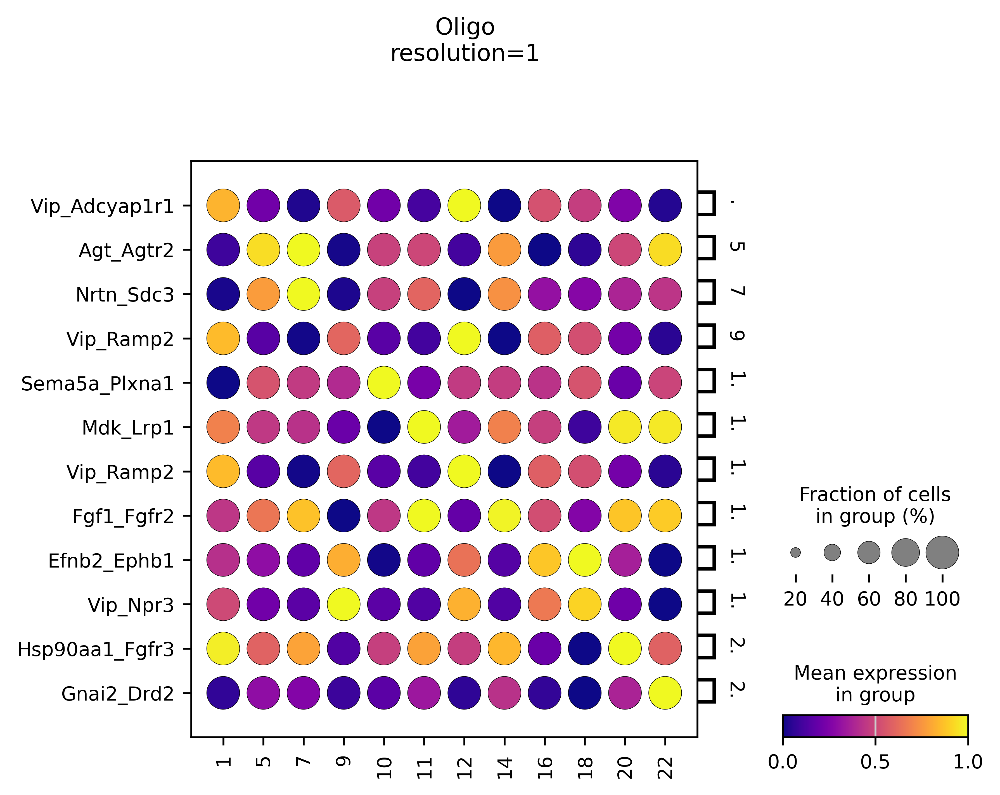

In [41]:
oligo_marker(adata_lri)

Additional analyses related to SVI patterns

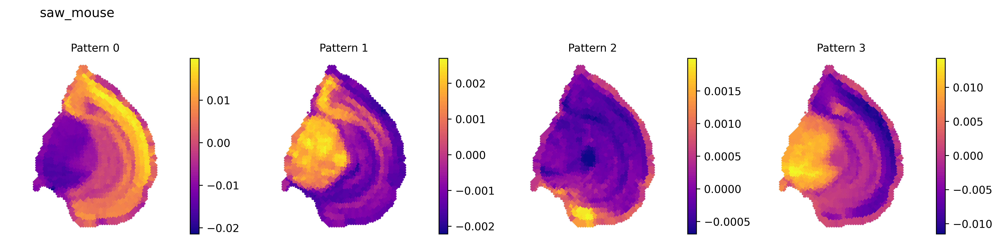

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

1_non-member vs. 1_member: Mann-Whitney-Wilcoxon test smaller with Benjamini-Hochberg correction, P_val:3.932e-06 U_stat=9.000e+00
0_non-member vs. 0_member: Mann-Whitney-Wilcoxon test smaller with Benjamini-Hochberg correction, P_val:3.863e-14 U_stat=1.100e+01
2_non-member vs. 2_member: Mann-Whitney-Wilcoxon test smaller with Benjamini-Hochberg correction, P_val:3.330e-04 U_stat=0.000e+00
3_non-member vs. 3_member: Mann-Whitney-Wilcoxon test smaller with Benjamini-Hochberg correction, P_val:5.856e-12 U_stat=5.900e+01


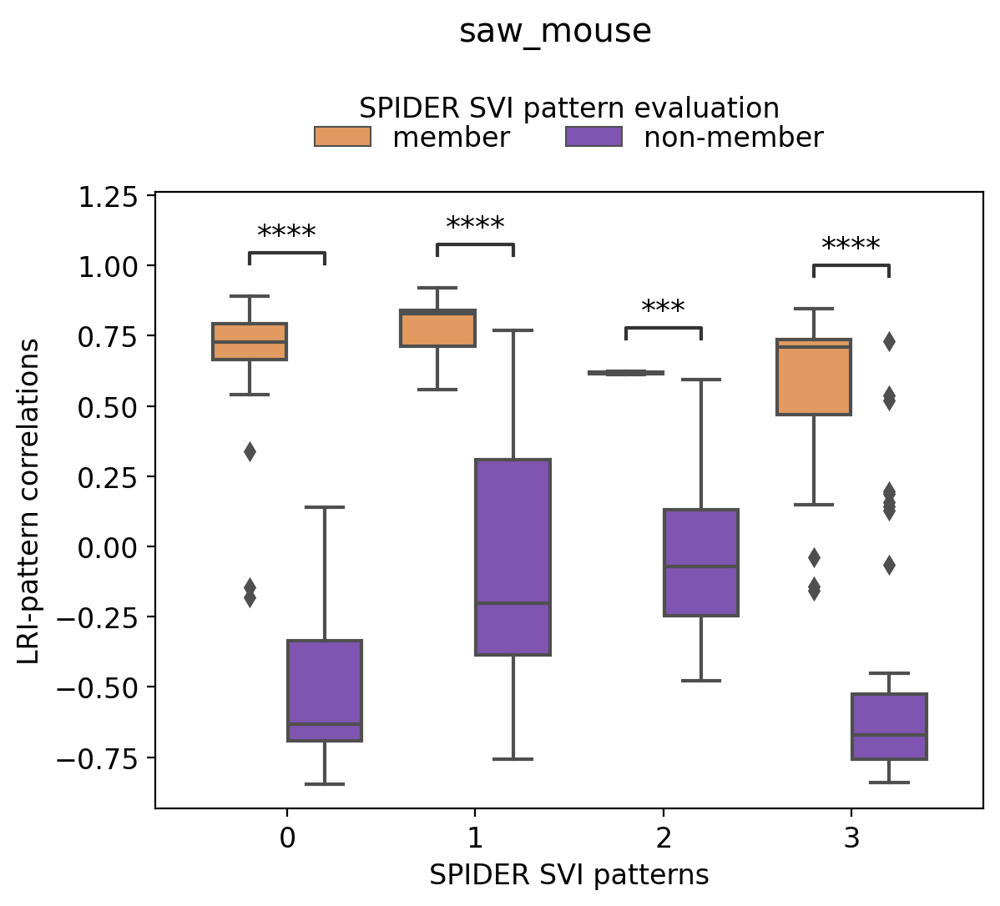

In [42]:
import matplotlib.pyplot as plt
op.vis.pattern_LRI(idata,show_SVI=0, spot_size=5)
plt.suptitle(f'{ds}_{sample_name}', x=0.03, y=1)
plt.tight_layout()
plt.show()
# reset all figure parameters
plt.rcParams.update(plt.rcParamsDefault)
plt.rcParams.update({'font.size': 12})
op.svi.eva_pattern(idata)
plt.suptitle(f'{ds}_{sample_name}', x=0.5, y=1.1)
plt.show()

Added key cell_pattern in idata.uns
Added key cell_score in idata.uns
Added key interaction_pattern, interaction_score in adata.obsm
Added key rank_interaction_score_groups, rank_interaction_pattern_groups in adata.uns


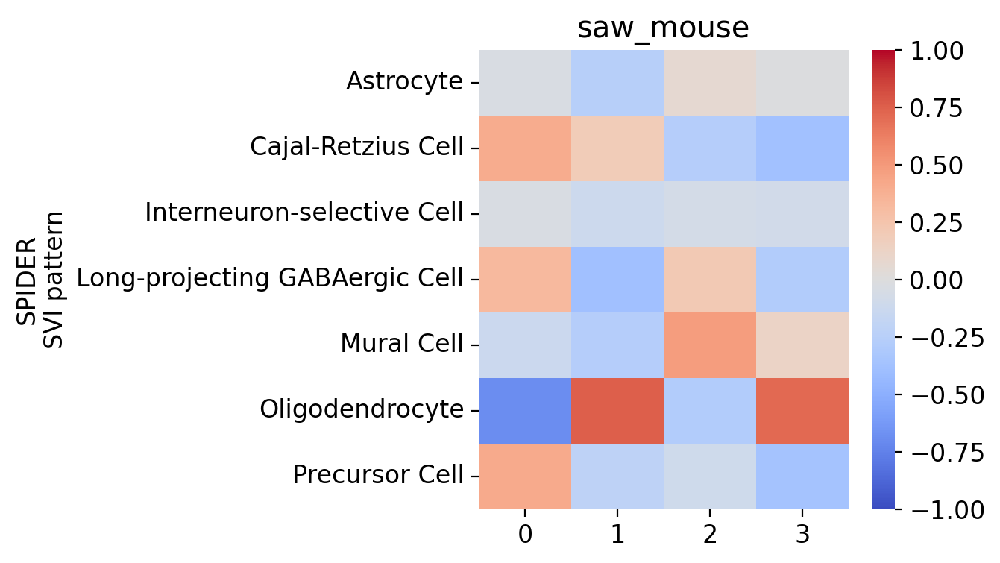

In [45]:
plt.figure(figsize=(4, 4))
import seaborn as sns
adata, adata_lri, adata_pattern = op.cell_transform(idata, adata, label=adata.uns['cluster_key'])
ldf = pd.get_dummies(adata.obs[adata.uns['cluster_key']])
sns.heatmap(np.corrcoef(ldf.to_numpy(), adata.obsm['interaction_pattern'],  rowvar=False)[:len(ldf.columns), len(ldf.columns):], vmin=-1, vmax=1, cmap='coolwarm', yticklabels=ldf.columns.str.replace('_', ' '),)
plt.ylabel('SPIDER\nSVI pattern')
plt.title(f'{ds}_{sample_name}')
plt.show()